<a href="https://colab.research.google.com/github/amisq987/uber/blob/main/Uber2014EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**1. Tiền xử lí dữ liệu**

1.1. Khai báo các thư viện cần thiết

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.cm as cm
import plotly.express as px

1.2. Kết nối dữ liệu

In [12]:
df_apr14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-apr14.csv')
df_may14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-may14.csv')
df_jun14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-jun14.csv')
df_jul14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-jul14.csv')
df_aug14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-aug14.csv')
df_sep14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-sep14.csv')

In [13]:
uber = pd.concat([df_apr14, df_may14, df_jun14, df_jul14, df_aug14, df_sep14], ignore_index=True)

1.3. Xử lí các giá trị bị thiếu

In [14]:
uber.isnull().sum()

,0
Date/Time,0
Lat,0
Lon,0
Base,0


1.4. Xử lí các giá trị bị trùng lập

In [15]:
uber.duplicated().sum()

np.int64(82581)

In [16]:
uber.drop_duplicates(inplace = True)

1.5. Xử lí dự liệu thời gian thời gian

ta thấy dữ liệu thời gian đang ở dịnh dạng object nên cần thay đổi định dạng dữ liệu thời gian và thêm các cột biểu diễn ngày, giờ, phút để thuận tiện hơn trong quá trình phân tích

In [17]:
uber.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4451746 entries, 0 to 4534326
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 169.8+ MB


In [18]:
#Đổi tên cột Date/Time thành Date_time
uber.rename(columns={'Date/Time':'Date_time'},inplace=True)

#Chuyển đổi loại dữ liệu thời gian cho cột Date_time
uber['Date_time'] = pd.to_datetime(uber['Date_time'])

#Tạo thêm các cột cho thời gian
uber['month'] = uber['Date_time'].dt.month
uber['weekday'] = uber['Date_time'].dt.day_name()
uber['day'] = uber['Date_time'].dt.day
uber['hour'] = uber['Date_time'].dt.hour
uber['minute'] = uber['Date_time'].dt.minute

In [19]:
uber.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4451746 entries, 0 to 4534326
Data columns (total 9 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date_time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
 4   month      int32         
 5   weekday    object        
 6   day        int32         
 7   hour       int32         
 8   minute     int32         
dtypes: datetime64[ns](1), float64(2), int32(4), object(2)
memory usage: 271.7+ MB


In [20]:
print(uber)

                  Date_time      Lat      Lon    Base  month  weekday  day  \
0       2014-04-01 00:11:00  40.7690 -73.9549  B02512      4  Tuesday    1   
1       2014-04-01 00:17:00  40.7267 -74.0345  B02512      4  Tuesday    1   
2       2014-04-01 00:21:00  40.7316 -73.9873  B02512      4  Tuesday    1   
3       2014-04-01 00:28:00  40.7588 -73.9776  B02512      4  Tuesday    1   
4       2014-04-01 00:33:00  40.7594 -73.9722  B02512      4  Tuesday    1   
...                     ...      ...      ...     ...    ...      ...  ...   
4534322 2014-09-30 22:57:00  40.7668 -73.9845  B02764      9  Tuesday   30   
4534323 2014-09-30 22:57:00  40.6911 -74.1773  B02764      9  Tuesday   30   
4534324 2014-09-30 22:58:00  40.8519 -73.9319  B02764      9  Tuesday   30   
4534325 2014-09-30 22:58:00  40.7081 -74.0066  B02764      9  Tuesday   30   
4534326 2014-09-30 22:58:00  40.7140 -73.9496  B02764      9  Tuesday   30   

         hour  minute  
0           0      11  
1           0  

In [21]:
uber.to_csv('uber_processed.csv', index=False)

**2. Phân tích khám phá (EDA)**

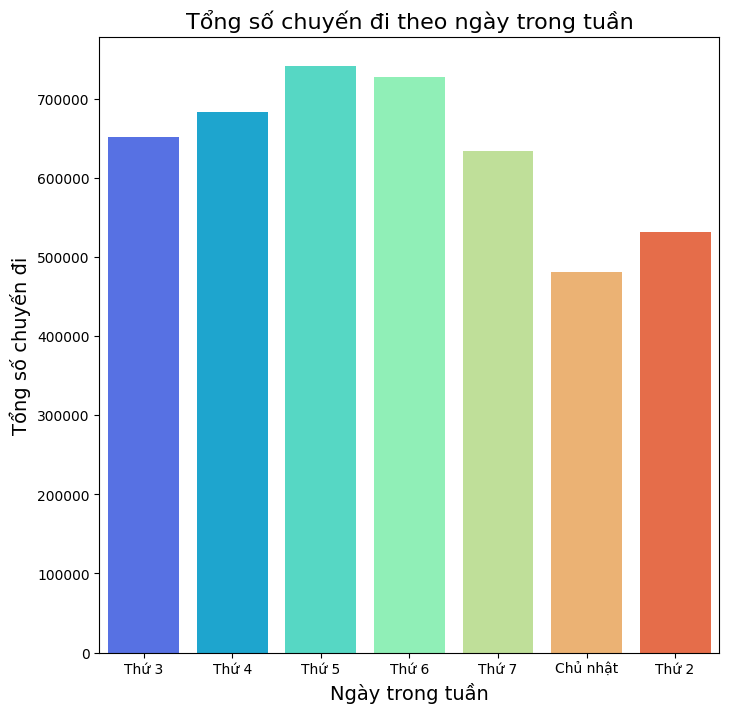

In [22]:
#Phân tích các chuyến đi theo ngày trong tuần
day_mapping = {
    "Monday": "Thứ 2",
    "Tuesday": "Thứ 3",
    "Wednesday": "Thứ 4",
    "Thursday": "Thứ 5",
    "Friday": "Thứ 6",
    "Saturday": "Thứ 7",
    "Sunday": "Chủ nhật"
}

# Đổi tên các ngày trong tuần sang tiếng Việt
uber["weekday_vi"] = uber["weekday"].replace(day_mapping)

# Vẽ biểu đồ với ngày trong tuần bằng tiếng Việt
plt.figure(figsize=(8,8))
sns.countplot(data=uber, x="weekday_vi", hue="weekday_vi", palette="rainbow", legend=False)

# Thêm tiêu đề và nhãn trục
plt.title("Tổng số chuyến đi theo ngày trong tuần", fontsize=16)
plt.xlabel("Ngày trong tuần", fontsize=14)
plt.ylabel("Tổng số chuyến đi", fontsize=14)

# Hiển thị biểu đồ
plt.show()

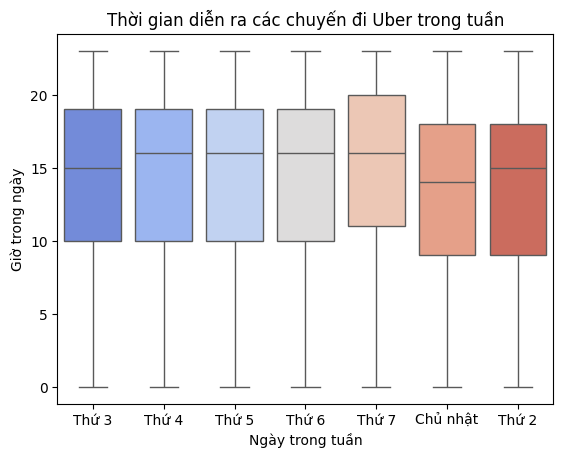

In [23]:
# Biểu đồ hộp phân tích thời gian diễn ra các chuyến đi Uber trong tuần
sns.boxplot(x='weekday_vi', y='hour', data=uber,hue='weekday_vi', palette='coolwarm',legend=False)
plt.title("Thời gian diễn ra các chuyến đi Uber trong tuần")
plt.xlabel("Ngày trong tuần")
plt.ylabel("Giờ trong ngày")
plt.show()

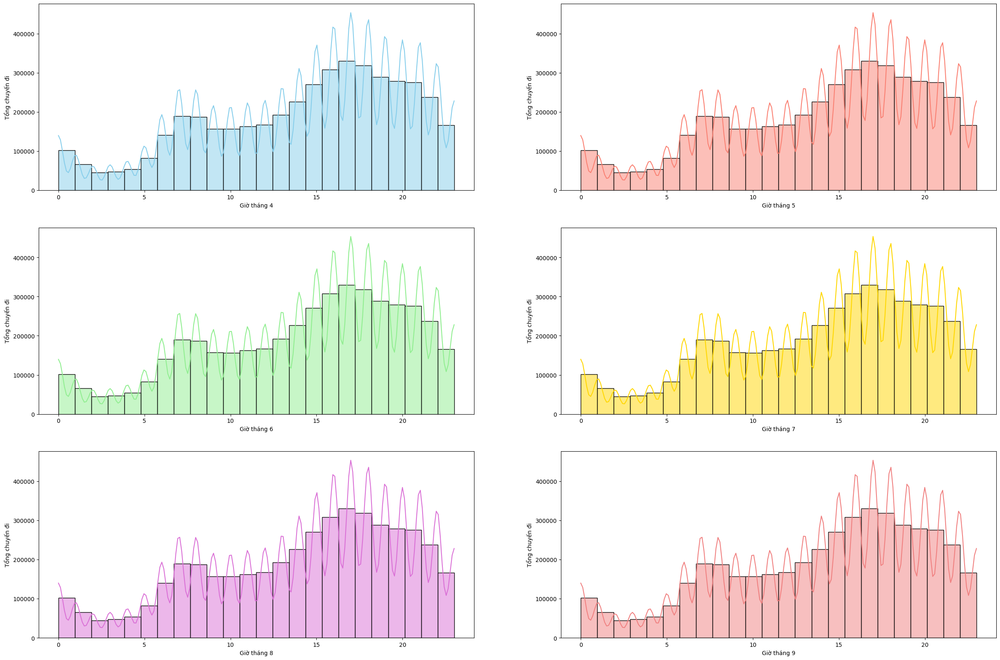

In [24]:
#Phân tích các chuyến đi theo giờ trong các tháng
plt.figure(figsize=(30,20))
colors = ['skyblue', 'salmon', 'lightgreen', 'gold', 'orchid', 'lightcoral']
for i,month in enumerate(uber['month'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=uber, x="hour", bins=24, kde=True, color=colors[i % len(colors)])
    plt.xlabel('Giờ tháng {}'.format(month))
    plt.ylabel('Tổng chuyến đi')

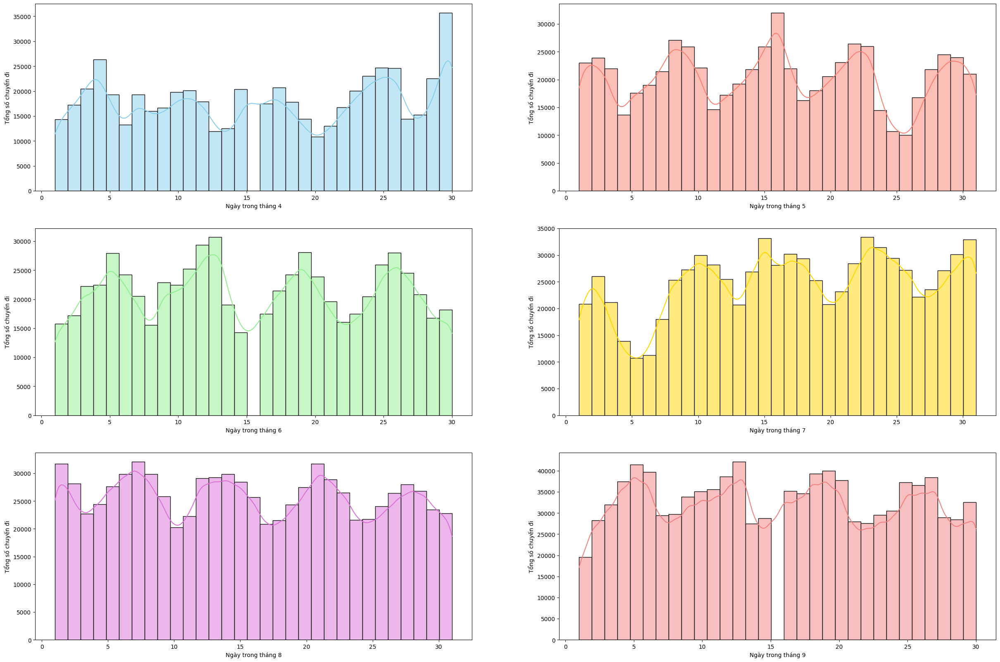

In [25]:
#Phân tích tổng số chuyến đi theo ngày trong các tháng
plt.figure(figsize=(30,20))
colors = ['skyblue', 'salmon', 'lightgreen', 'gold', 'orchid', 'lightcoral']
for i,month in enumerate(uber['month'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=uber,x=uber[uber['month'] == month]['day'],bins=31,kde=True, color=colors[i % len(colors)])
    plt.xlabel('Ngày trong tháng {}'.format(month))
    plt.ylabel('Tổng số chuyến đi')

In [26]:
#Phân tích tháng nào có tổng số giờ chạy nhiều nhất
uber.groupby('month')['hour'].count()

,hour
month,
4,556767
5,642360
6,653158
7,781969
8,813393
9,1004099


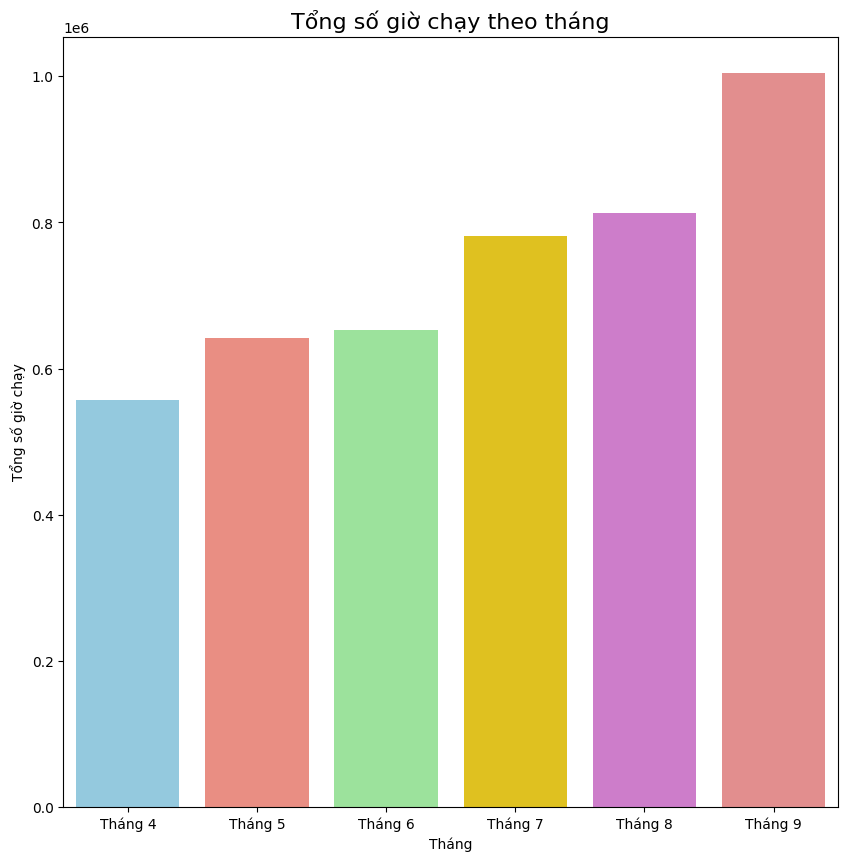

In [27]:
monthly_trips = uber.groupby('month')['hour'].count().reset_index(name='Tổng số giờ chạy')
colors = ['skyblue', 'salmon', 'lightgreen', 'gold', 'orchid', 'lightcoral']
plt.figure(figsize=(10,10))
sns.barplot(data=monthly_trips, x='month', y='Tổng số giờ chạy', hue='month', palette=colors, legend=False)
plt.xticks(ticks=[0,1,2,3,4,5],labels=['Tháng 4','Tháng 5','Tháng 6','Tháng 7','Tháng 8','Tháng 9'])
plt.xlabel('Tháng'.format(month))
plt.title("Tổng số giờ chạy theo tháng", fontsize=16)
plt.show()

In [28]:
#Phân tích chuyến đi theo ngày
uber.groupby('day')['hour'].count()

,hour
day,
1,125282
2,140767
3,140688
4,138361
5,144547
6,137313
7,140983
8,143530
9,152500


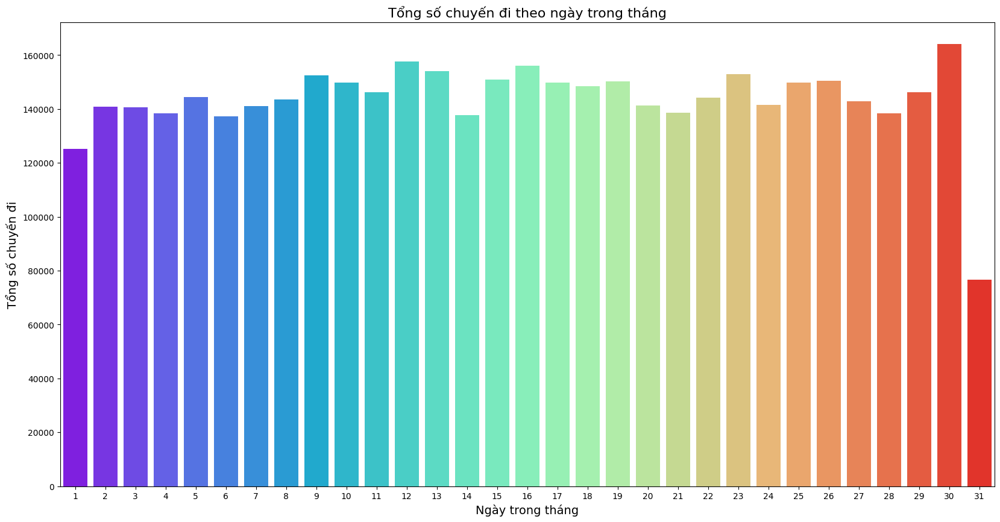

In [29]:
# Phân tích chuyến đi theo ngày
day_counts = uber.groupby('day')['hour'].count().reset_index(name='counts')

# Dùng colormap mới
cmap = plt.colormaps['rainbow']

# Tạo danh sách màu từ colormap
colors = [cmap(i / len(day_counts)) for i in range(len(day_counts))]

# Vẽ biểu đồ cột với màu sắc rực rỡ hơn
plt.figure(figsize=(20, 10))
bars = sns.barplot(x='day', y='counts', hue='day', data=day_counts, palette=colors, legend=False)

# Thêm tiêu đề và nhãn trục
plt.title("Tổng số chuyến đi theo ngày trong tháng", fontsize=16)
plt.xlabel("Ngày trong tháng", fontsize=14)
plt.ylabel("Tổng số chuyến đi", fontsize=14)

# Hiển thị biểu đồ
plt.show()

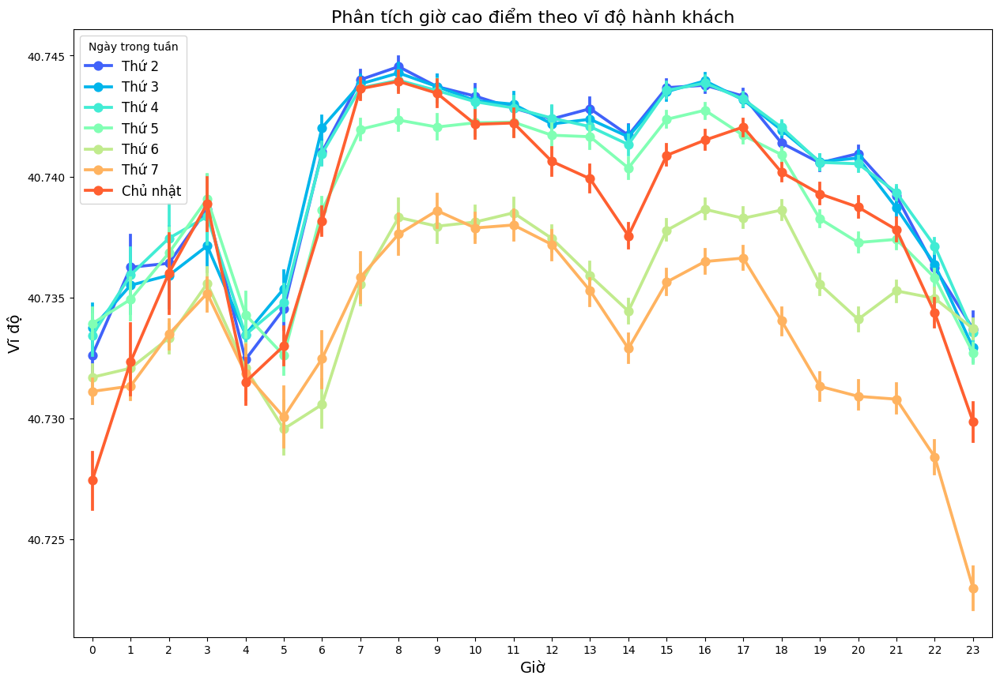

In [30]:
#Phân tích giờ cao điểm
# Danh sách ngày trong tuần bằng tiếng Việt
days_vietnamese = ["Thứ 2", "Thứ 3", "Thứ 4", "Thứ 5", "Thứ 6", "Thứ 7", "Chủ nhật"]

# Vẽ biểu đồ
plt.figure(figsize=(15,10))
sns.pointplot(data=uber, x='hour', y='Lat', hue='weekday', palette="rainbow")

# Đổi tiêu đề sang tiếng Việt
plt.title("Phân tích giờ cao điểm theo vĩ độ hành khách", fontsize=16)

# Lấy handles và labels tự động từ biểu đồ để giữ đúng màu
handles, labels = plt.gca().get_legend_handles_labels()

# Thêm legend với nhãn tiếng Việt & giữ nguyên màu sắc
plt.legend(handles=handles, labels=days_vietnamese, title="Ngày trong tuần", fontsize=12)
plt.xlabel("Giờ", fontsize=14)
plt.ylabel("Vĩ độ", fontsize=14)


# Hiển thị biểu đồ
plt.show()

In [31]:
#Phân tích các địa điểm có tổng số lượng chuyến đi cao nhất theo giờ
base = uber.groupby(['Base','hour'])['Date_time'].count().reset_index()
base

,Base,hour,Date_time
0,B02512,0,3495
1,B02512,1,2081
2,B02512,2,1446
3,B02512,3,1544
4,B02512,4,1774
...,...,...,...
115,B02764,19,17134
116,B02764,20,15935
117,B02764,21,15095
118,B02764,22,13085


In [32]:
fig4=px.scatter(base,
            x='hour',
            y='Date_time',
            color='Base',
            template='plotly_dark',
            color_discrete_sequence=['#50F9F1','#6AE5A8','#96C96A','#B7AA47','#C78845'])
fig4.update_layout(title_text='Tổng các chuyến đi theo địa điểm và thời gian trong ngày', title_x=0.5)


fig4.update_xaxes(title_text="Giờ")
fig4.update_yaxes(title_text="Tổng chuyến đi")

fig4.show()

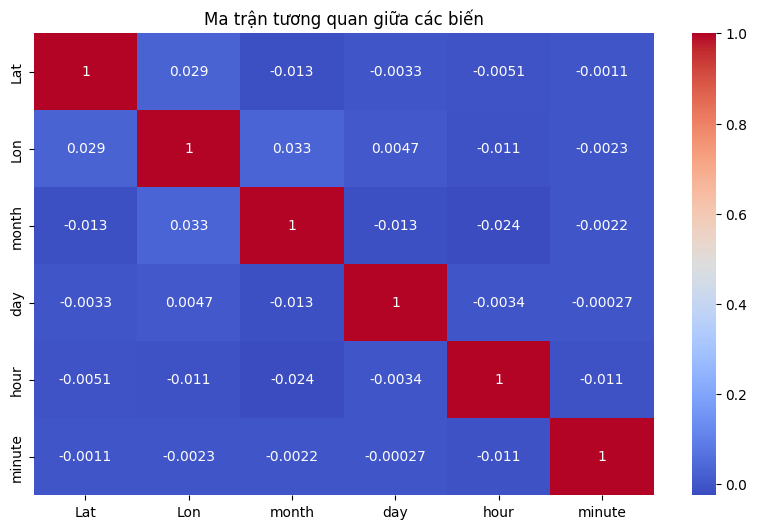

In [33]:
# Ma trận tương quan
plt.figure(figsize=(10,6))
numerical_features = uber.select_dtypes(include=np.number)
sns.heatmap(numerical_features.corr(), annot=True, cmap='coolwarm')
plt.title("Ma trận tương quan giữa các biến")
plt.show()

In [34]:
#Bản đồ nhiệt

day_mapping = {
    "Monday": "Thứ 2",
    "Tuesday": "Thứ 3",
    "Wednesday": "Thứ 4",
    "Thursday": "Thứ 5",
    "Friday": "Thứ 6",
    "Saturday": "Thứ 7",
    "Sunday": "Chủ nhật"
}

# Đổi tên các ngày trong tuần sang tiếng Việt
uber["weekday_vi"] = uber["weekday"].replace(day_mapping)

def count_rows(row):
    return len(row)


def heatmap(col1,col2):
    by_cross = uber.groupby([col1,col2]).size().unstack()
    plt.figure(figsize=(12,8))
    sns.heatmap(by_cross, cmap="coolwarm")

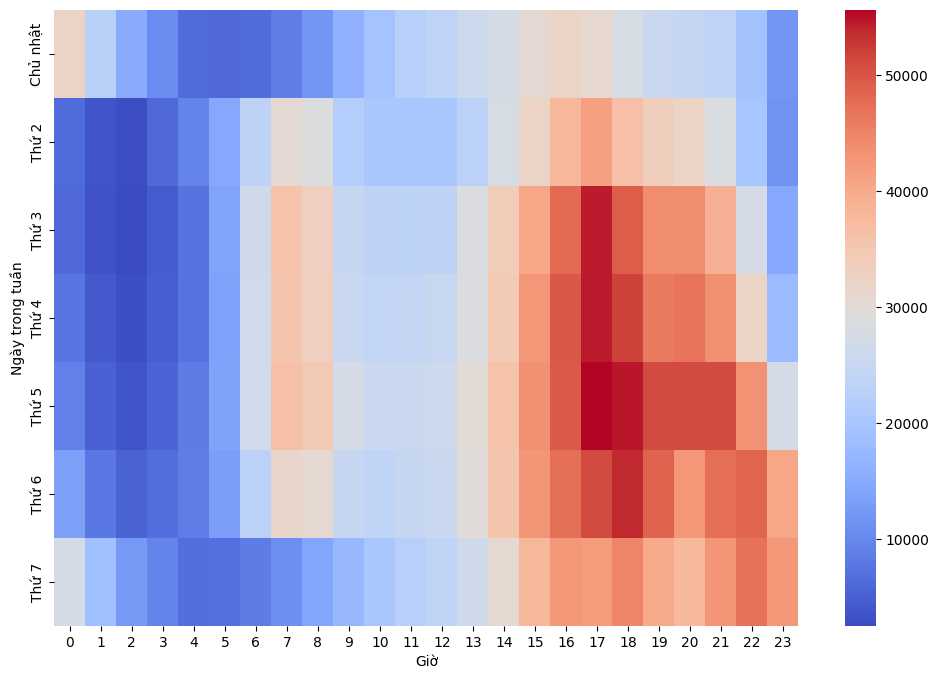

In [35]:
#Theo giờ và ngày trong tuần
heatmap('weekday_vi', 'hour')
plt.xlabel('Giờ')
plt.ylabel('Ngày trong tuần')
plt.show()

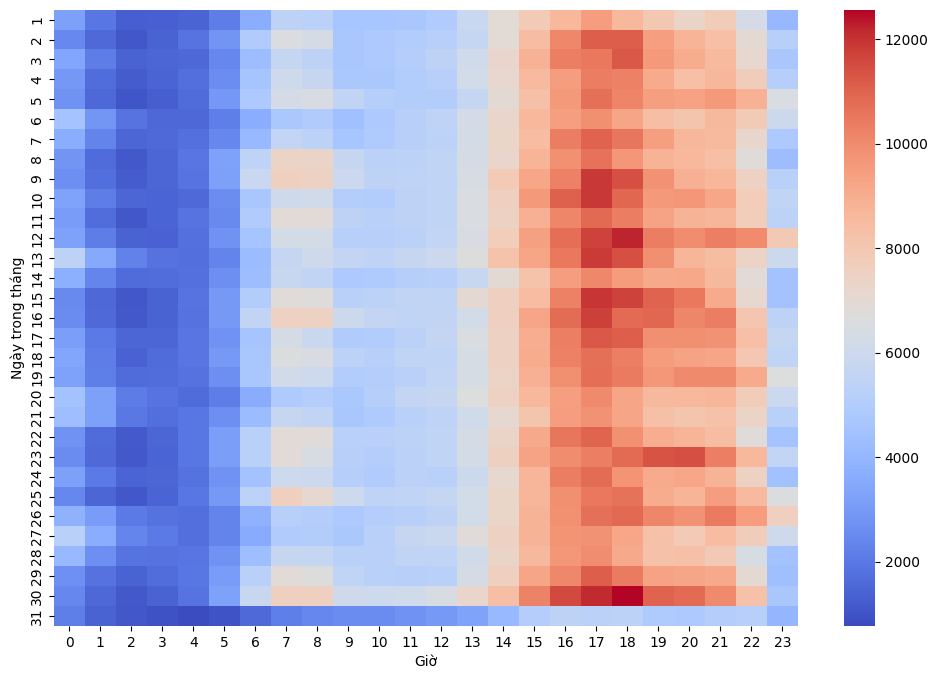

In [36]:
#Theo giờ và ngày trong tháng
heatmap('day', 'hour')
plt.xlabel('Giờ')
plt.ylabel('Ngày trong tháng')
plt.show()

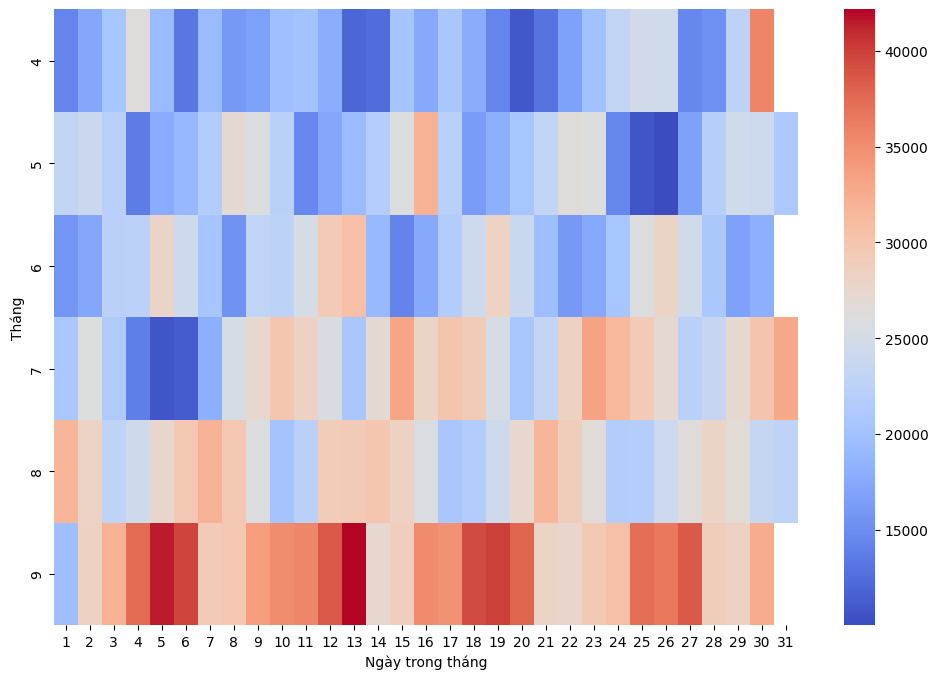

In [37]:
#Theo tháng và ngày trong tháng
heatmap('month', 'day')
plt.xlabel('Ngày trong tháng')
plt.ylabel('Tháng')
plt.show()

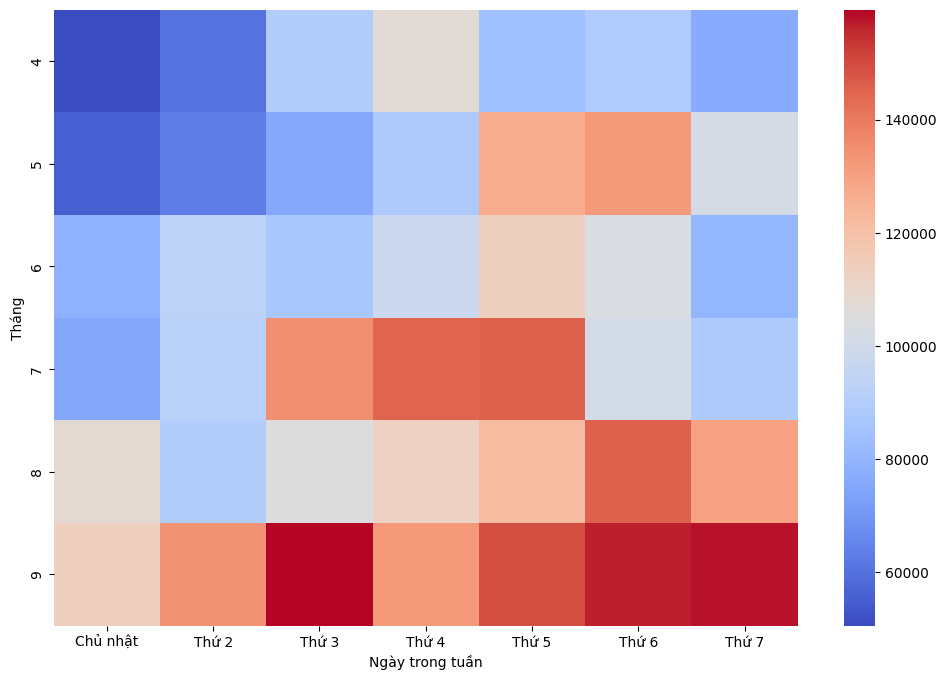

In [38]:
#Theo tháng và ngày trong tuần
heatmap('month', 'weekday_vi')
plt.xlabel('Ngày trong tuần')
plt.ylabel('Tháng')
plt.show()

In [39]:
#Phân tích không gian địa lý để hiểu nhu cầu taxi
Demand=(uber.groupby(['Lat','Lon']).count()['Date_time']).reset_index()
Demand.columns=['Latitude','Longitude','Number of Trips']
import folium as fo
from folium.plugins import HeatMap
base1=fo.Map()
HeatMap(Demand,zoom=20,radius=15).add_to(base1)
base1